<a href="https://colab.research.google.com/github/AnanyaSourav/LUAD-1--2--and-3--combinations-analysis/blob/main/LUAD_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import os

# --- Configuration ---
# IMPORTANT: Update this variable to the path of the folder containing your files
folder_path = '/content/drive/MyDrive/linkedOmics'

# The list of file extensions to convert
extensions_to_convert = ['.tsi', '.cct', '.cbt']

# Create a folder to store the output CSV files
output_folder = os.path.join(os.path.dirname(folder_path), 'Converted_CSV_Files')
os.makedirs(output_folder, exist_ok=True)

# --- Conversion Logic ---
# Get a list of all files in the specified folder
files_in_folder = os.listdir(folder_path)

for file_name in files_in_folder:
    # Check if the file has one of the target extensions
    if any(file_name.endswith(ext) for ext in extensions_to_convert):
        try:
            input_file_path = os.path.join(folder_path, file_name)

            # Use pandas to read the tab-separated file
            # The 'sep=\\t' argument is crucial for these files
            df = pd.read_csv(input_file_path, sep='\t')

            # Construct the output CSV file path
            base_name = os.path.splitext(file_name)[0]
            output_file_path = os.path.join(output_folder, f'{base_name}.csv')

            # Save the DataFrame to a new CSV file
            df.to_csv(output_file_path, index=False)

            print(f'Successfully converted: {file_name} -> {os.path.basename(output_file_path)}')

        except Exception as e:
            print(f'Error converting {file_name}: {e}')

print("\nConversion process complete.")

Successfully converted: Methylation (Gene level, HM450K).cct -> Methylation (Gene level, HM450K).csv
Successfully converted: RNAseq (HiSeq, Gene level).cct -> RNAseq (HiSeq, Gene level).csv
Successfully converted: SCNV (Gene level, log-ratio).cct -> SCNV (Gene level, log-ratio).csv
Successfully converted: Clinical.tsi -> Clinical.csv
Successfully converted: miRNA (HiSeq, miRgene level).cct -> miRNA (HiSeq, miRgene level).csv
Successfully converted: RPPA (Gene Level).cct -> RPPA (Gene Level).csv
Successfully converted: Mutation (Gene level).cbt -> Mutation (Gene level).csv

Conversion process complete.


In [ ]:
import os
import pandas as pd

# 📂 Path where all CSV files are stored
folder_path = "/content/drive/MyDrive/Converted_CSV_Files"   # <-- change this to your folder path

# Function to summarize each file
def summarize_csv(file_path):
    try:
        df = pd.read_csv(file_path)
    except Exception as e:
        print(f"❌ Could not read {file_path}: {e}")
        return None

    summary = {
        "File": os.path.basename(file_path),
        "Shape": df.shape,
        "Columns": list(df.columns[:10]) + (["..."] if len(df.columns) > 10 else []), # first 10 cols only
        "dtypes": dict(df.dtypes.astype(str).head(10)), # first 10 dtypes
        "NaN_Count": df.isna().sum().sum(),
        "Sample_Head": df.head(2).to_dict()
    }
    return summary

# Collect summaries
summaries = []
for file in os.listdir(folder_path):
    if file.endswith(".csv"):
        file_path = os.path.join(folder_path, file)
        summary = summarize_csv(file_path)
        if summary:
            summaries.append(summary)

# Convert summaries into a dataframe for overview
summary_df = pd.DataFrame(summaries)

# Show summary table
pd.set_option("display.max_colwidth", None)
print(summary_df)

# Save summary for inspection
summary_df.to_csv("omics_file_summaries.csv", index=False)

print("\n✅ Summary saved as omics_file_summaries.csv")


                                   File         Shape                                                                                                                                           Columns                                                                                                                                                                                                                                                                        dtypes  NaN_Count  \
0  Methylation (Gene level, HM450K).csv  (20115, 459)  [attrib_name, TCGA.05.4384, TCGA.05.4390, TCGA.05.4396, TCGA.05.4405, TCGA.05.4410, TCGA.05.4415, TCGA.05.4417, TCGA.05.4424, TCGA.05.4425, ...]  {'attrib_name': 'object', 'TCGA.05.4384': 'float64', 'TCGA.05.4390': 'float64', 'TCGA.05.4396': 'float64', 'TCGA.05.4405': 'float64', 'TCGA.05.4410': 'float64', 'TCGA.05.4415': 'float64', 'TCGA.05.4417': 'float64', 'TCGA.05.4424': 'float64', 'TCGA.05.4425': 'float64'}       5608   
1        RNAseq (HiSeq, Gene lev

In [ ]:
import os
import pandas as pd
from functools import reduce

# 📂 Path where all omics CSV files are stored
folder_path = "/content/drive/MyDrive/Converted_CSV_Files"  # <-- change this to your folder path
output_path = "/content/standardized_data"
os.makedirs(output_path, exist_ok=True)

# 1. Load all files
data_dict = {}
for file in os.listdir(folder_path):
    if file.endswith(".csv"):
        file_path = os.path.join(folder_path, file)
        df = pd.read_csv(file_path)

        # First column is gene/probe/attribute names
        df = df.set_index(df.columns[0])
        data_dict[file.replace(".csv", "")] = df

print("✅ Loaded all omics data")

# 2. Extract patient/sample IDs for each dataset
patient_sets = {name: set(df.columns) for name, df in data_dict.items()}

# Find common patients across ALL omics files
common_patients = set.intersection(*patient_sets.values())
print(f"🔗 Common patients across all omics: {len(common_patients)}")

# 3. Subset each dataframe to only common patients
standardized_data = {}
for name, df in data_dict.items():
    df_filtered = df.loc[:, df.columns.isin(common_patients)]
    standardized_data[name] = df_filtered

    # Save standardized version
    out_file = os.path.join(output_path, f"{name}_standardized.csv")
    df_filtered.to_csv(out_file)
    print(f"💾 Saved {out_file} with shape {df_filtered.shape}")

# 4. Save common patient list
pd.Series(sorted(common_patients)).to_csv(os.path.join(output_path, "common_patients.csv"), index=False)

print("\n🎯 Standardization complete!")

✅ Loaded all omics data
🔗 Common patients across all omics: 291
💾 Saved /content/standardized_data/Methylation (Gene level, HM450K)_standardized.csv with shape (20115, 291)
💾 Saved /content/standardized_data/RNAseq (HiSeq, Gene level)_standardized.csv with shape (19988, 291)
💾 Saved /content/standardized_data/SCNV (Gene level, log-ratio)_standardized.csv with shape (24776, 291)
💾 Saved /content/standardized_data/Clinical_standardized.csv with shape (15, 291)
💾 Saved /content/standardized_data/miRNA (HiSeq, miRgene level)_standardized.csv with shape (809, 291)
💾 Saved /content/standardized_data/RPPA (Gene Level)_standardized.csv with shape (174, 291)
💾 Saved /content/standardized_data/Mutation (Gene level)_standardized.csv with shape (12602, 291)

🎯 Standardization complete!


In [ ]:
import pandas as pd
import numpy as np
import os

# === Paths ===
clinical_file = "/content/drive/MyDrive/Converted_CSV_Files/Clinical.csv"   # <- update with actual path
standardized_out = "/content/standardized_data/Clinical_standardized.csv"

# === Step 1: Load clinical file ===
clinical_df = pd.read_csv(clinical_file)

# First column is attrib_name, rest are patient IDs
clinical_df = clinical_df.set_index("attrib_name")

# === Step 2: Transpose so patients = rows ===
clinical_df = clinical_df.T.reset_index()
clinical_df = clinical_df.rename(columns={"index": "PatientID"})

# === Step 3: Clean column names ===
clinical_df.columns = (
    clinical_df.columns.str.strip()
    .str.lower()
    .str.replace(" ", "_")
    .str.replace("-", "_")
)

# === Step 4: Convert survival + status columns ===
# Make sure survival time is numeric
for col in ["overall_survival", "overallsurvival"]:
    if col in clinical_df.columns:
        clinical_df[col] = pd.to_numeric(clinical_df[col], errors="coerce")

# Convert status to binary (0=alive, 1=dead) if it exists
if "status" in clinical_df.columns:
    clinical_df["status"] = clinical_df["status"].astype(str).str.lower()
    clinical_df["status"] = clinical_df["status"].replace({
        "alive": 0, "dead": 1, "0": 0, "1": 1
    })
    clinical_df["status"] = pd.to_numeric(clinical_df["status"], errors="coerce")

# === Step 5: Align patients with standardized omics ===
# Load one standardized omics file to get patient IDs
omics_example = pd.read_csv("/content/standardized_data/RNAseq (HiSeq, Gene level)_standardized.csv", index_col=0)
omics_patients = list(omics_example.columns)

clinical_df = clinical_df[clinical_df["patientid"].isin(omics_patients)]

# === Step 6: Save standardized clinical file ===
clinical_df.to_csv(standardized_out, index=False)

# === Step 7: Summary ===
summary = {
    "Shape": clinical_df.shape,
    "Columns": clinical_df.columns.tolist(),
    "NaN_Per_Column": clinical_df.isna().sum().to_dict(),
    "Dtypes": clinical_df.dtypes.to_dict(),
    "Sample_Rows": clinical_df.head(3).to_dict(orient="records")
}

import pprint
pprint.pprint(summary)

{'Columns': ['patientid',
             'years_to_birth',
             'tumor_purity',
             'pathologic_stage',
             'pathology_t_stage',
             'pathology_n_stage',
             'pathology_m_stage',
             'histological_type',
             'gender',
             'radiation_therapy',
             'residual_tumor',
             'race',
             'ethnicity',
             'overall_survival',
             'status',
             'overallsurvival'],
 'Dtypes': {'ethnicity': dtype('O'),
            'gender': dtype('O'),
            'histological_type': dtype('O'),
            'overall_survival': dtype('float64'),
            'overallsurvival': dtype('float64'),
            'pathologic_stage': dtype('O'),
            'pathology_m_stage': dtype('O'),
            'pathology_n_stage': dtype('O'),
            'pathology_t_stage': dtype('O'),
            'patientid': dtype('O'),
            'race': dtype('O'),
            'radiation_therapy': dtype('O'),
            '

In [ ]:
import pandas as pd
import numpy as np

# Load clinical file
df = pd.read_csv("/content/drive/MyDrive/linkedOmics/standardized_data/Clinical_standardized.csv")

# --- Step 1: Standardize column names ---
df.columns = df.columns.str.strip().str.lower().str.replace(" ", "_")

# --- Step 2: Drop duplicate/redundant columns ---
if "overallsurvival" in df.columns and "overall_survival" in df.columns:
    # Keep the filled one (overall_survival has values, overallsurvival is empty)
    df = df.drop(columns=["overallsurvival"])

# --- Step 3: Convert numeric columns ---
numeric_cols = ["years_to_birth", "tumor_purity", "overall_survival", "status"]
for col in numeric_cols:
    if col in df.columns:
        df[col] = pd.to_numeric(df[col], errors="coerce")

# --- Step 4: Standardize categorical values ---
# Convert to lowercase
categorical_cols = df.select_dtypes(include="object").columns
for col in categorical_cols:
    df[col] = df[col].astype(str).str.strip().str.lower().replace({"nan": np.nan})

# Example mapping for uniform categories
stage_map = {
    "stagei": "stage i", "stageii": "stage ii", "stageiii": "stage iii", "stageiv": "stage iv"
}
df["pathologic_stage"] = df["pathologic_stage"].replace(stage_map)

binary_map = {"yes": 1, "no": 0, "y": 1, "n": 0}
if "radiation_therapy" in df.columns:
    df["radiation_therapy"] = df["radiation_therapy"].replace(binary_map).astype("float64")

# --- Step 5: Save standardized file ---
df.to_csv("clinical_standardized.csv", index=False)

# --- Step 6: Generate summary ---
summary = {
    "Shape": df.shape,
    "Num_Patients": df["patientid"].nunique() if "patientid" in df.columns else df.shape[0],
    "Numeric_Columns": {col: {
        "NaN_Count": df[col].isna().sum(),
        "Mean": df[col].mean(),
        "Std": df[col].std(),
        "Min": df[col].min(),
        "Max": df[col].max()
    } for col in numeric_cols if col in df.columns},
    "Categorical_Columns": {col: {
        "NaN_Count": df[col].isna().sum(),
        "Unique_Values": df[col].nunique(),
        "Top_Values": df[col].value_counts().head(5).to_dict()
    } for col in categorical_cols}
}

import pprint
pprint.pprint(summary)


{'Categorical_Columns': {'ethnicity': {'NaN_Count': np.int64(85),
                                       'Top_Values': {'hispanicorlatino': 6,
                                                      'nothispanicorlatino': 200},
                                       'Unique_Values': 2},
                         'gender': {'NaN_Count': np.int64(0),
                                    'Top_Values': {'female': 159, 'male': 132},
                                    'Unique_Values': 2},
                         'histological_type': {'NaN_Count': np.int64(0),
                                               'Top_Values': {'lungacinaradenocarcinoma': 11,
                                                              'lungadenocarcinoma-nototherwisespecified(nos)': 176,
                                                              'lungadenocarcinomamixedsubtype': 61,
                                                              'lungbronchioloalveolarcarcinomanonmucinous': 13,
                    

/tmp/ipython-input-1644675503.py:35: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df["radiation_therapy"] = df["radiation_therapy"].replace(binary_map).astype("float64")


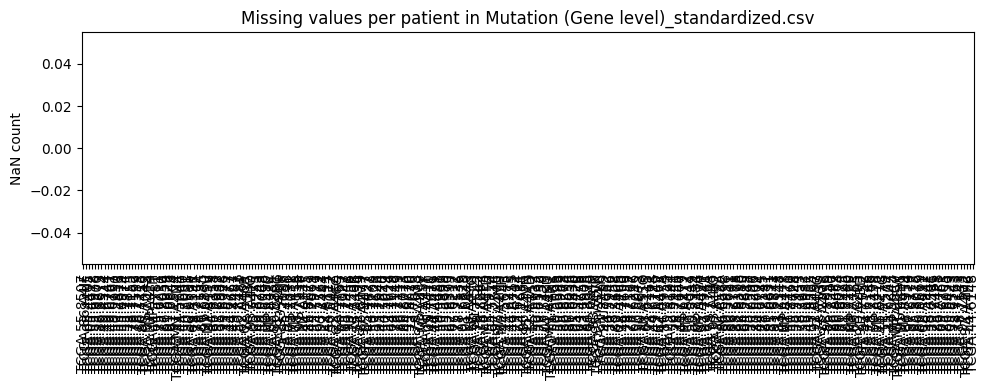

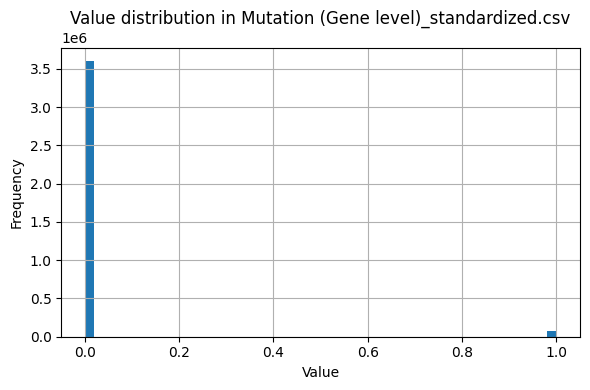

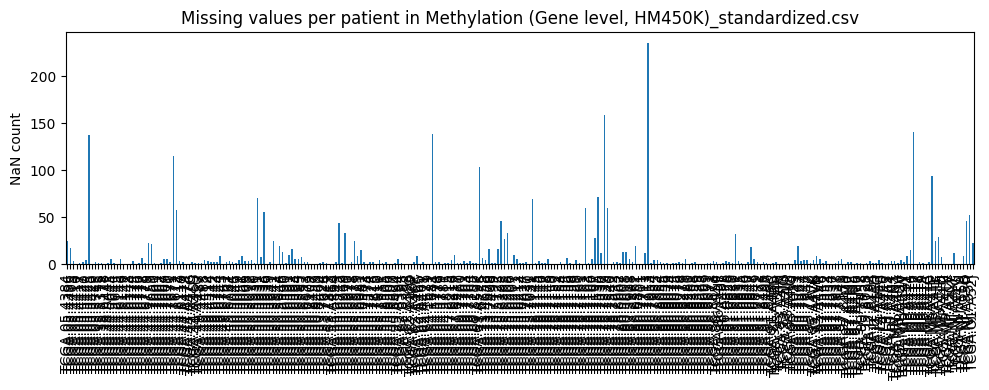

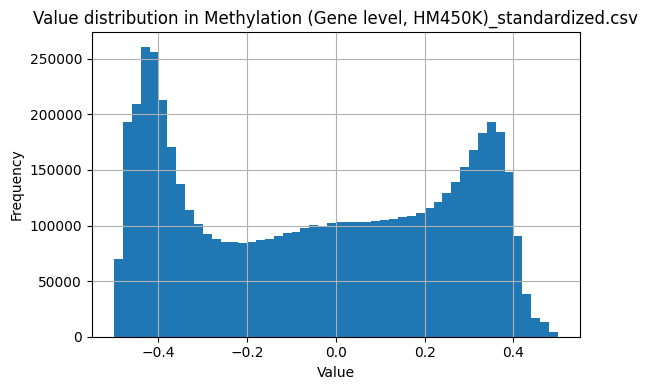

❌ Could not process Clinical_standardized.csv: '<=' not supported between instances of 'str' and 'float'


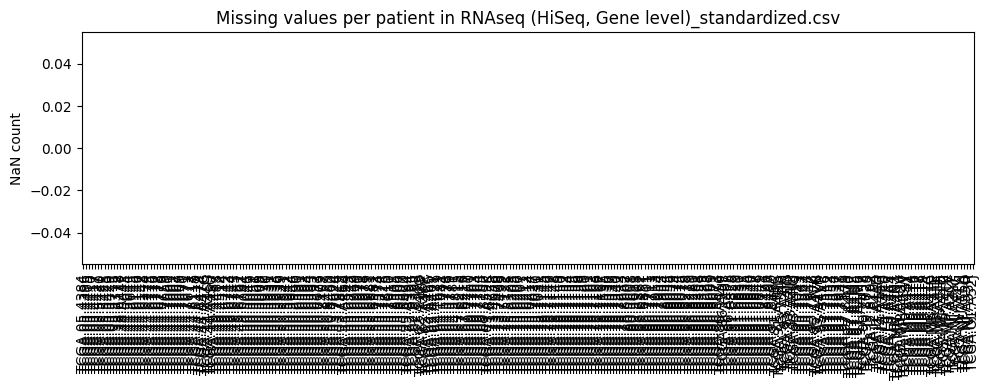

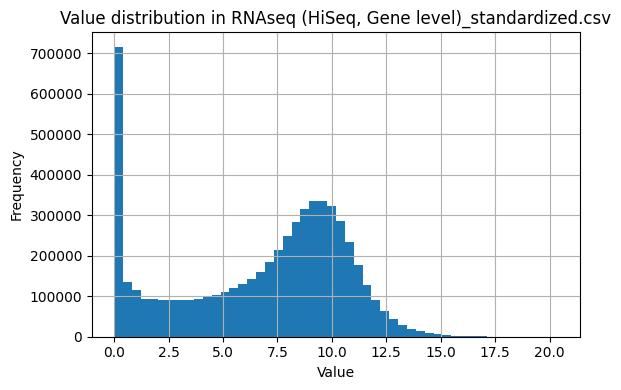

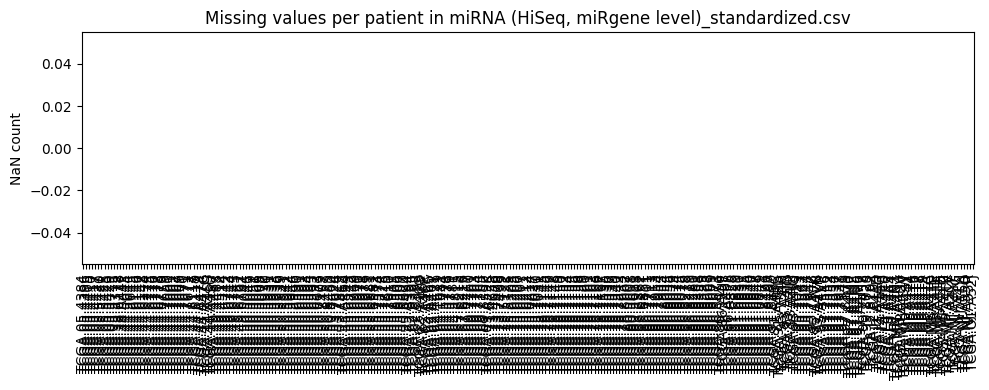

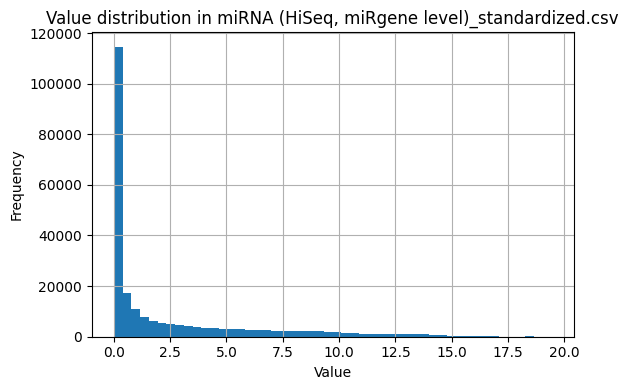

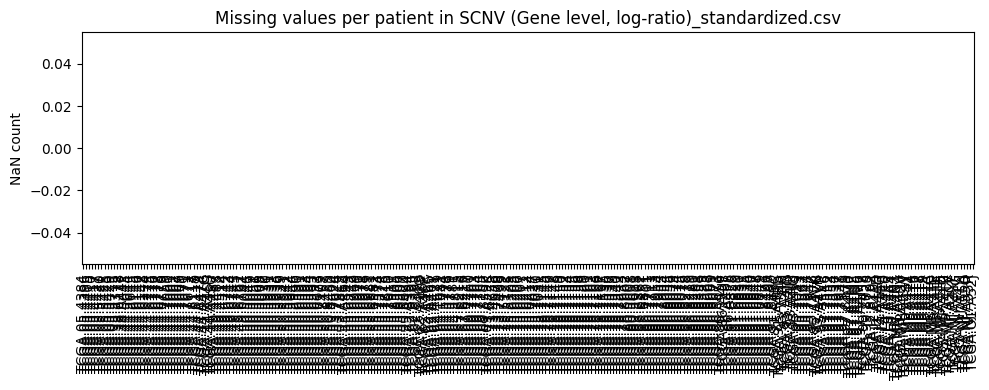

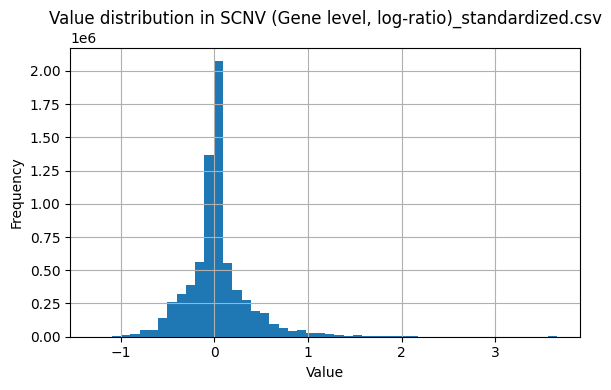

❌ Could not process standardized_summary.csv: ufunc 'greater_equal' did not contain a loop with signature matching types (<class 'numpy.dtypes.Int64DType'>, <class 'numpy.dtypes.StrDType'>) -> None


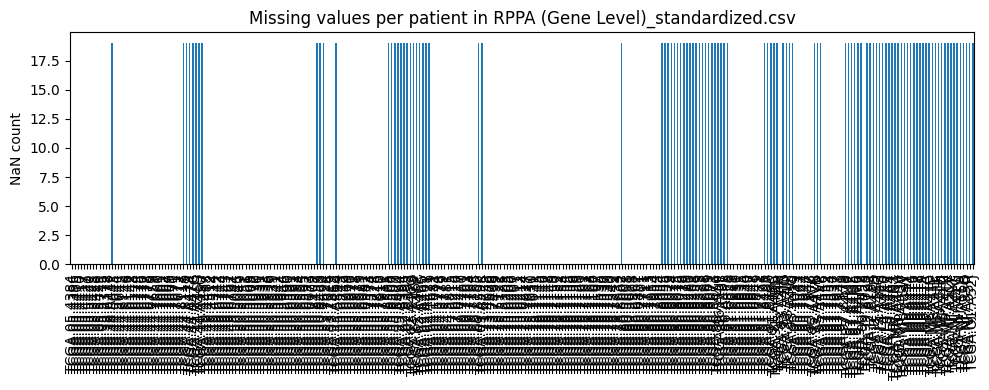

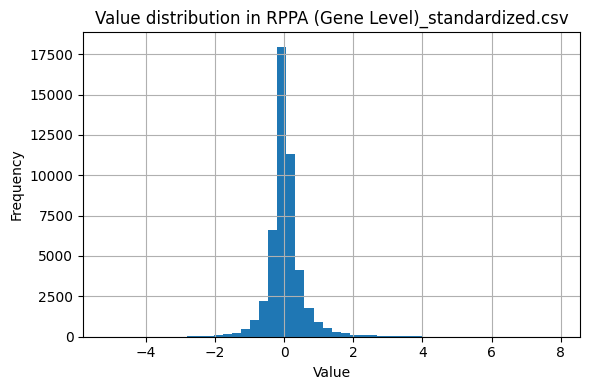


✅ Detailed summary saved as standardized_summary.csv

Summary DataFrame:
                                                File         Shape  Num_Features  Num_Patients  NaN_Total  NaN_Percentage        Value_Range  Mean_Per_Feature  Std_Per_Feature
0             Mutation (Gene level)_standardized.csv  (12602, 291)         12602           291          0        0.000000             (0, 1)          0.018620         0.121069
1  Methylation (Gene level, HM450K)_standardized.csv  (20115, 291)         20115           291       2840        0.048518        (-0.5, 0.5)         -0.042900         0.089125
2        RNAseq (HiSeq, Gene level)_standardized.csv  (19988, 291)         19988           291          0        0.000000     (0.0, 20.3817)          6.687767         0.973360
3      miRNA (HiSeq, miRgene level)_standardized.csv    (809, 291)           809           291          0        0.000000     (0.0, 19.4342)          2.400576         0.655052
4      SCNV (Gene level, log-ratio)_standardiz

In [ ]:
import os
import pandas as pd
import matplotlib.pyplot as plt

# 📂 Folder where standardized files are stored
folder_path = "/content/drive/MyDrive/linkedOmics/standardized_data"

summaries = []

for file in os.listdir(folder_path):
    if file.endswith(".csv") and "common_patients" not in file:
        file_path = os.path.join(folder_path, file)

        try:
            df = pd.read_csv(file_path, index_col=0)

            # Summary info
            summary = {
                "File": file,
                "Shape": df.shape,
                "Num_Features": df.shape[0],
                "Num_Patients": df.shape[1],
                "NaN_Total": df.isna().sum().sum(),
                "NaN_Percentage": (df.isna().sum().sum() / (df.shape[0]*df.shape[1])) * 100
            }

            # Handle non-numerical data in Clinical.csv separately
            if file == "Clinical.csv":
                summary["Value_Range"] = "Not applicable (contains non-numeric data)"
                summary["Mean_Per_Feature"] = "Not applicable"
                summary["Std_Per_Feature"] = "Not applicable"
            else:
                summary["Value_Range"] = (df.min().min(), df.max().max())
                summary["Mean_Per_Feature"] = df.mean(axis=1).mean()
                summary["Std_Per_Feature"] = df.std(axis=1).mean()

            summaries.append(summary)

            # --- QC Plots ---
            plt.figure(figsize=(10,4))
            df.isna().sum().plot(kind="bar")
            plt.title(f"Missing values per patient in {file}")
            plt.ylabel("NaN count")
            plt.tight_layout()
            plt.show()

            plt.figure(figsize=(6,4))
            pd.Series(df.values.flatten()).dropna().hist(bins=50)
            plt.title(f"Value distribution in {file}")
            plt.xlabel("Value")
            plt.ylabel("Frequency")
            plt.tight_layout()
            plt.show()

        except Exception as e:
            print(f"❌ Could not process {file}: {e}")

# Save summary as CSV
summary_df = pd.DataFrame(summaries)
summary_df.to_csv(os.path.join(folder_path, "standardized_summary.csv"), index=False)

print("\n✅ Detailed summary saved as standardized_summary.csv")
print("\nSummary DataFrame:")
print(summary_df)

In [ ]:
import pandas as pd
import glob, os

def clean_tcga_ids(ids):
    """Standardize TCGA IDs (remove '.' and lowercase issues)."""
    return ids.str.upper().str.replace(".", "-", regex=False)

def standardize_files(input_folder, output_folder):
    os.makedirs(output_folder, exist_ok=True)

    # Collect all files
    files = glob.glob(os.path.join(input_folder, "*_standardized.csv"))

    patient_sets = []
    processed_files = {}

    for f in files:
        df = pd.read_csv(f)

        # Clinical file has patientid column
        if "clinical" in os.path.basename(f).lower():
            if "patientid" in df.columns:
                df = df.rename(columns={"patientid": "patient_id"})
            df["patient_id"] = clean_tcga_ids(df["patient_id"])
            df = df.drop_duplicates(subset=["patient_id"])
            patients = set(df["patient_id"])
        else:
            # Omics file: attrib_name column + TCGA IDs
            df.columns = df.columns.str.strip()
            df.rename(columns={df.columns[0]: "attrib_name"}, inplace=True)
            df.columns = [df.columns[0]] + list(clean_tcga_ids(df.columns[1:]))
            df = df.loc[:, ~df.columns.duplicated()]
            patients = set(df.columns[1:])  # exclude attrib_name

        patient_sets.append(patients)
        processed_files[f] = df

    # Intersect all patients across files
    common_patients = set.intersection(*patient_sets)

    print(f"✅ Common Patients across all files: {len(common_patients)}")

    # Save cleaned files with only common patients
    for f, df in processed_files.items():
        if "clinical" in os.path.basename(f).lower():
            df = df[df["patient_id"].isin(common_patients)]
        else:
            keep_cols = ["attrib_name"] + list(common_patients)
            df = df.loc[:, df.columns.isin(keep_cols)]
        out_path = os.path.join(output_folder, os.path.basename(f))
        df.to_csv(out_path, index=False)

    return common_patients

# Example usage
common_patients = standardize_files(
    input_folder="/content/drive/MyDrive/linkedOmics/standardized_data",
    output_folder="harmonized_files"
)

✅ Common Patients across all files: 291


In [ ]:
# Cell 1: install & imports
!pip install --quiet lifelines scikit-learn matplotlib seaborn joblib

import os, glob, itertools, math, json
import numpy as np, pandas as pd
from sklearn.model_selection import KFold
from lifelines import CoxPHFitter
from lifelines.utils import concordance_index
import matplotlib.pyplot as plt
import seaborn as sns
from joblib import Parallel, delayed
from scipy import stats
np.random.seed(42)

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 349.3/349.3 kB 12.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.2/117.2 kB 8.1 MB/s eta 0:00:00


In [ ]:
# Cell 2: config and helpers
DATA_DIR = "/content/drive/MyDrive/linkedOmics/harmonized_files"   # <-- update to your folder
OUT_DIR = "/content/drive/MyDrive/linkedOmics/analysis_results"
os.makedirs(OUT_DIR, exist_ok=True)

OMICS_FILES = {
    # file-key : filename (should be in DATA_DIR)
    "RNA": "RNAseq (HiSeq, Gene level)_standardized.csv",
    "METH": "Methylation (Gene level, HM450K)_standardized.csv",
    "SCNV": "SCNV (Gene level, log-ratio)_standardized.csv",
    "MIRNA": "miRNA (HiSeq, miRgene level)_standardized.csv",
    "MUT": "Mutation (Gene level)_standardized.csv",   # mutation should be gene-level binary/count
    "RPPA": "RPPA (Gene Level)_standardized.csv"
}

CLINICAL_FILE = "Clinical_standardized.csv"

# Parameters
TOP_K = 200             # top K features per omics for modeling (adjustable)
OUTER_FOLDS = 5
INNER_FOLDS = 3
PENALIZER_GRID = [0.0, 0.01, 0.1, 1.0]   # L2 penalizer values for lifelines CoxPHFitter

# Helper: load omics into dict of DataFrames (rows=feature, cols=patient)
def load_omics_files(data_dir, omics_files):
    omics = {}
    for key, fname in omics_files.items():
        path = os.path.join(data_dir, fname)
        if not os.path.exists(path):
            raise FileNotFoundError(f"{path} missing")
        df = pd.read_csv(path, index_col=0)
        # columns are patient TCGA IDs
        omics[key] = df.copy()
    return omics

# Helper: load clinical (rows=patient)
def load_clinical(data_dir, fname):
    path = os.path.join(data_dir, fname)
    df = pd.read_csv(path)
    if "patientid" in df.columns:
        df = df.rename(columns={"patientid":"patient_id"})
    # ensure patient_id column present
    if "patient_id" not in df.columns:
        raise KeyError("clinical file must have 'patient_id' column")
    df = df.set_index("patient_id")
    return df

# quick sanity
omics = load_omics_files(DATA_DIR, OMICS_FILES)
clinical = load_clinical(DATA_DIR, CLINICAL_FILE)
print("Loaded omics keys:", list(omics.keys()))
print("Clinical shape:", clinical.shape)

Loaded omics keys: ['RNA', 'METH', 'SCNV', 'MIRNA', 'MUT', 'RPPA']
Clinical shape: (291, 15)


In [ ]:
# Cell 3: Basic preprocessing helpers
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler

def preprocess_feature_matrix(df, drop_all_na=True):
    # df: features x patients
    # drop features with all NA or (optionally) zero variance
    df = df.replace([np.inf, -np.inf], np.nan)
    if drop_all_na:
        df = df.loc[~df.isna().all(axis=1)]
    # drop zero variance features
    variances = df.var(axis=1, ddof=0)
    df = df.loc[variances > 0]
    # impute remaining NaNs with median per feature
    imputer = SimpleImputer(strategy="median")
    arr = imputer.fit_transform(df.values)
    df2 = pd.DataFrame(arr, index=df.index, columns=df.columns)
    # per-feature zscore across patients (so each gene has mean 0, sd 1)
    df2 = df2.subtract(df2.mean(axis=1), axis=0).divide(df2.std(axis=1).replace(0,1), axis=0)
    return df2

# Preprocess all omics and store
omics_pp = {}
for k, df in omics.items():
    print(f"Preprocessing {k}: original shape {df.shape}")
    omics_pp[k] = preprocess_feature_matrix(df)
    print(f" -> post shape {omics_pp[k].shape}")

Preprocessing RNA: original shape (19988, 291)
 -> post shape (19984, 291)
Preprocessing METH: original shape (20115, 291)
 -> post shape (20115, 291)
Preprocessing SCNV: original shape (24776, 291)
 -> post shape (24776, 291)
Preprocessing MIRNA: original shape (809, 291)
 -> post shape (809, 291)
Preprocessing MUT: original shape (12602, 291)
 -> post shape (12260, 291)
Preprocessing RPPA: original shape (174, 291)
 -> post shape (174, 291)


In [ ]:
# Cell 4: Univariate Cox to get top-K features per omics
from lifelines import CoxPHFitter

def univariate_cox_per_omics(feature_df, clinical_df, time_col="overall_survival", event_col="status", topk=TOP_K):
    # feature_df: features x patients
    # clinical_df: patients x clinical_cols (index=patient_id)
    results = []
    patients = list(feature_df.columns)
    clin = clinical_df.loc[patients, [time_col, event_col]].dropna()
    # keep only patients with survival info
    common_p = clin.index.intersection(feature_df.columns)
    feature_df = feature_df.loc[:, common_p]
    clin = clin.loc[common_p]
    for feat in feature_df.index:
        x = feature_df.loc[feat].T.to_frame(name="x")
        df = pd.concat([x, clin], axis=1)
        try:
            cph = CoxPHFitter(penalizer=0.0)
            cph.fit(df, duration_col=time_col, event_col=event_col, show_progress=False)
            p = float(cph.summary.loc["x", "p"])
            hr = float(cph.summary.loc["x", "exp(coef)"])
        except Exception:
            p = np.nan; hr = np.nan
        results.append((feat, p, hr))
    res_df = pd.DataFrame(results, columns=["feature","p","hr"]).dropna().sort_values("p")
    # FDR adjustment
    from statsmodels.stats.multitest import multipletests
    if not res_df.empty:
        res_df["fdr"] = multipletests(res_df["p"].values, method="fdr_bh")[1]
    else:
        res_df["fdr"] = []
    top_features = res_df.head(topk)["feature"].tolist()
    return res_df, top_features

top_features_by_omics = {}
univ_results = {}
for k, df in omics_pp.items():
    print("Univariate Cox for:", k)
    res_df, top_feats = univariate_cox_per_omics(df, clinical)
    univ_results[k] = res_df
    top_features_by_omics[k] = top_feats
    print(f" -> top {len(top_feats)} features kept")

Univariate Cox for: RNA


/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:1120: ConvergenceWarning: Column x have very low variance when conditioned on death event present or not. This may harm convergence. This could be a form of 'complete separation'. For example, try the following code:

>>> events = df['status'].astype(bool)
>>> print(df.loc[events, 'x'].var())
>>> print(df.loc[~events, 'x'].var())

A very low variance means that the column x completely determines whether a subject dies or not. See https://stats.stackexchange.com/questions/11109/how-to-deal-with-perfect-separation-in-logistic-regression.

  warnings.warn(dedent(warning_text), ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/fitters/coxph_fitter.py:1607: ConvergenceWarning: Newton-Raphson convergence completed successfully but norm(delta) is still high, 0.174. This may imply non-unique solutions to the maximum likelihood. Perhaps there is collinearity or complete separation in the dataset?

  warnings

 -> top 200 features kept
Univariate Cox for: METH
 -> top 200 features kept
Univariate Cox for: SCNV
 -> top 200 features kept
Univariate Cox for: MIRNA


/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:1120: ConvergenceWarning: Column x have very low variance when conditioned on death event present or not. This may harm convergence. This could be a form of 'complete separation'. For example, try the following code:

>>> events = df['status'].astype(bool)
>>> print(df.loc[events, 'x'].var())
>>> print(df.loc[~events, 'x'].var())

A very low variance means that the column x completely determines whether a subject dies or not. See https://stats.stackexchange.com/questions/11109/how-to-deal-with-perfect-separation-in-logistic-regression.

  warnings.warn(dedent(warning_text), ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/fitters/coxph_fitter.py:1607: ConvergenceWarning: Newton-Raphson convergence completed successfully but norm(delta) is still high, 0.152. This may imply non-unique solutions to the maximum likelihood. Perhaps there is collinearity or complete separation in the dataset?

  warnings

 -> top 200 features kept
Univariate Cox for: MUT


Streaming output truncated to the last 5000 lines.
>>> print(df.loc[events, 'x'].var())
>>> print(df.loc[~events, 'x'].var())

A very low variance means that the column x completely determines whether a subject dies or not. See https://stats.stackexchange.com/questions/11109/how-to-deal-with-perfect-separation-in-logistic-regression.

  warnings.warn(dedent(warning_text), ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/fitters/coxph_fitter.py:1607: ConvergenceWarning: Newton-Raphson convergence completed successfully but norm(delta) is still high, 0.104. This may imply non-unique solutions to the maximum likelihood. Perhaps there is collinearity or complete separation in the dataset?

  warnings.warn(
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:1120: ConvergenceWarning: Column x have very low variance when conditioned on death event present or not. This may harm convergence. This could be a form of 'complete separation'. For example, try th

 -> top 200 features kept
Univariate Cox for: RPPA
 -> top 174 features kept


In [ ]:
# Cell 5: build combo matrices (patients x features) for given omics list
def build_combo_matrix(omics_keys, top_features_map, omics_pp_dict):
    frames = []
    for k in omics_keys:
        feats = top_features_map.get(k, omics_pp_dict[k].index.tolist())
        df = omics_pp_dict[k].loc[feats].copy()
        # rename features by prefix to avoid duplicate names
        df.index = [f"{k}|{g}" for g in df.index]
        frames.append(df)
    if len(frames) == 0:
        return None
    combo = pd.concat(frames, axis=0)
    # return patients x features
    return combo.T

# quick test build single
X_rna = build_combo_matrix(["RNA"], top_features_by_omics, omics_pp)
print("RNA combo shape (patients x features):", X_rna.shape)

RNA combo shape (patients x features): (291, 200)


In [ ]:
# Cell 6: nested CV + training (lifelines Cox with L2 penalizer)
def nested_cv_cox(X, clin, time_col="overall_survival", event_col="status",
                  outer_folds=OUTER_FOLDS, inner_folds=INNER_FOLDS, penalizer_grid=PENALIZER_GRID):
    patients = list(X.index)
    clin_sub = clin.loc[patients, [time_col, event_col]].dropna()
    patients = clin_sub.index.tolist()
    X = X.loc[patients]
    y_time = clin_sub[time_col]
    y_event = clin_sub[event_col]
    outer = KFold(n_splits=outer_folds, shuffle=True, random_state=42)
    fold_cindices = []
    fold_models = []
    for train_idx, test_idx in outer.split(patients):
        train_p = [patients[i] for i in train_idx]
        test_p = [patients[i] for i in test_idx]
        X_train = X.loc[train_p].copy()
        X_test = X.loc[test_p].copy()
        clin_train = clin_sub.loc[train_p]
        clin_test = clin_sub.loc[test_p]
        # inner tuning
        best_pen = penalizer_grid[0]
        best_score = -np.inf
        inner = KFold(n_splits=inner_folds, shuffle=True, random_state=42)
        for pen in penalizer_grid:
            scores = []
            for itrain, itest in inner.split(train_p):
                ip = [train_p[i] for i in itrain]
                jp = [train_p[i] for i in itest]
                df_tr = X_train.loc[ip].copy()
                df_tr[time_col] = clin_train.loc[ip, time_col]
                df_tr[event_col] = clin_train.loc[ip, event_col]
                df_val = X_train.loc[jp].copy()
                df_val[time_col] = clin_train.loc[jp, time_col]
                df_val[event_col] = clin_train.loc[jp, event_col]
                try:
                    cph = CoxPHFitter(penalizer=pen)
                    cph.fit(df_tr, duration_col=time_col, event_col=event_col, show_progress=False)
                    pred = cph.predict_partial_hazard(df_val.drop(columns=[time_col, event_col]))
                    ci = concordance_index(df_val[time_col], -pred.values.flatten(), df_val[event_col])
                except Exception:
                    ci = np.nan
                scores.append(ci)
            mean_score = np.nanmean(scores)
            if mean_score > best_score:
                best_score = mean_score; best_pen = pen
        # fit final on full train with best_pen
        df_train_full = X_train.copy()
        df_train_full[time_col] = clin_train[time_col]
        df_train_full[event_col] = clin_train[event_col]
        df_test_full = X_test.copy()
        df_test_full[time_col] = clin_test[time_col]
        df_test_full[event_col] = clin_test[event_col]
        try:
            cph_final = CoxPHFitter(penalizer=best_pen)
            cph_final.fit(df_train_full, duration_col=time_col, event_col=event_col, show_progress=False)
            pred_test = cph_final.predict_partial_hazard(df_test_full.drop(columns=[time_col, event_col]))
            ci_test = concordance_index(df_test_full[time_col], -pred_test.values.flatten(), df_test_full[event_col])
        except Exception:
            ci_test = np.nan; cph_final = None
        fold_cindices.append(ci_test)
        fold_models.append(cph_final)
    return fold_cindices, fold_models

# small test on RNA
cidxs, models = nested_cv_cox(X_rna, clinical)
print("RNA per-fold cindices:", cidxs, "mean:", np.nanmean(cidxs))

/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/tmp/ipython-input-3900140091.py:43: RuntimeWarning: Mean of empty slice
  mean_score = np.nanmean(scores)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your 

In [ ]:
# Cell 7: iterate all combos (singles, pairs, triples) and collect results in a DataFrame
omics_keys = list(OMICS_FILES.keys())
from itertools import combinations

combos = []
# singles
for k in omics_keys:
    combos.append((k,))
# pairs
combos += list(combinations(omics_keys, 2))
# triples
combos += list(combinations(omics_keys, 3))

results = []
# parallelize at combo-level if desired
for combo in combos:
    combo_name = "+".join(combo)
    print("Running combo:", combo_name)
    X = build_combo_matrix(combo, top_features_by_omics, omics_pp)
    # if too many features, you may reduce dimensionality here (e.g., PCA), but we proceed
    try:
        cidxs, models = nested_cv_cox(X, clinical)
    except Exception as e:
        print("Failed combo", combo_name, ":", e)
        cidxs = [np.nan]*OUTER_FOLDS
    # aggregate metrics
    mean_c = float(np.nanmean(cidxs))
    std_c = float(np.nanstd(cidxs))
    # bootstrap 95% CI of mean across folds (small-sample approximate)
    lo = mean_c - 1.96*std_c/math.sqrt(len([v for v in cidxs if not np.isnan(v)]))
    hi = mean_c + 1.96*std_c/math.sqrt(len([v for v in cidxs if not np.isnan(v)]))
    results.append({
        "combo": combo_name,
        "n_features": X.shape[1],
        "mean_cindex": mean_c,
        "std_cindex": std_c,
        "ci95_lo": lo,
        "ci95_hi": hi,
        "per_fold": cidxs
    })
    # save interim
    pd.DataFrame(results).to_csv(os.path.join(OUT_DIR, "combo_results_partial.csv"), index=False)

# final save
res_df = pd.DataFrame(results).sort_values("mean_cindex", ascending=False).reset_index(drop=True)
res_df.to_csv(os.path.join(OUT_DIR, "combo_results.csv"), index=False)
print("Saved results to", os.path.join(OUT_DIR, "combo_results.csv"))

Running combo: RNA


/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/tmp/ipython-input-3900140091.py:43: RuntimeWarning: Mean of empty slice
  mean_score = np.nanmean(scores)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your 

Running combo: METH


/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/tmp/ipython-input-3900140091.py:43: RuntimeWarning: Mean of empty slice
  mean_score = np.nanmean(scores)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your 

Running combo: SCNV


/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/tmp/ipython-input-3900140091.py:43: RuntimeWarning: Mean of empty slice
  mean_score = np.nanmean(scores)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your 

Running combo: MIRNA


/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:1120: ConvergenceWarning: Column MIRNA|hsa-mir-1207 have very low variance when conditioned on death event present or not. This may harm convergence. This could be a form of 'complete separation'. For example, try the following code:

>>> events = df['status'].astype(bool)
>>> print(df.loc[events, 'MIRNA|hsa-mir-1207'].var())
>>> print(df.loc[~events, 'MIRNA|hsa-mir-1207'].var())

A very low variance means that the column MIRNA|hsa-mir-1207 completely determines whether a subject dies or not. See https://stats.stackexchange.com/questions/11109/how-to-deal-with-perfect-separation-in-logistic-regression.

  warnings.warn(dedent(warning_text), ConvergenceWarning

Running combo: MUT


/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:1100: ConvergenceWarning: Column(s) ['MUT|C2orf89', 'MUT|MTHFD1', 'MUT|TEAD4', 'MUT|SEC61A1', 'MUT|GTPBP1', 'MUT|PDIA2', 'MUT|AQP9', 'MUT|DSN1', 'MUT|GUCY2C', 'MUT|MPHOSPH9', 'MUT|MIPEP'] have very low variance. This may harm convergence. 1) Are you using formula's? Did you mean to add '-1' to the end. 2) Try dropping this redundant column before fitting if convergence fails.

  warnings.warn(dedent(warning_text), ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:1120: ConvergenceWarning: Column MUT|AARS have very low variance when conditioned on death event present or not. This may harm convergence. This could be a form 

Running combo: RPPA


/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/tmp/ipython-input-3900140091.py:43: RuntimeWarning: Mean of empty slice
  mean_score = np.nanmean(scores)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your 

Running combo: RNA+METH


/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/tmp/ipython-input-3900140091.py:43: RuntimeWarning: Mean of empty slice
  mean_score = np.nanmean(scores)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your 

Running combo: RNA+SCNV


/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/tmp/ipython-input-3900140091.py:43: RuntimeWarning: Mean of empty slice
  mean_score = np.nanmean(scores)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your 

Running combo: RNA+MIRNA


/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:1120: ConvergenceWarning: Column MIRNA|hsa-mir-1207 have very low variance when conditioned on death event present or not. This may harm convergence. This could be a form of 'complete separation'. For example, try the following code:

>>> events = df['status'].astype(bool)
>>> print(df.loc[events, 'MIRNA|hsa-mir-1207'].var())
>>> print(df.loc[~events, 'MIRNA|hsa-mir-1207'].var())

A very low variance means that the column MIRNA|hsa-mir-1207 completely determines whether a subject dies or not. See https://stats.stackexchange.com/questions/11109/how-to-deal-with-perfect-separation-in-logistic-regression.

  warnings.warn(dedent(warning_text), ConvergenceWarning

Running combo: RNA+MUT


/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:1100: ConvergenceWarning: Column(s) ['MUT|RIBC1', 'MUT|NOP2', 'MUT|KIF22', 'MUT|KIAA1370'] have very low variance. This may harm convergence. 1) Are you using formula's? Did you mean to add '-1' to the end. 2) Try dropping this redundant column before fitting if convergence fails.

  warnings.warn(dedent(warning_text), ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:1120: ConvergenceWarning: Column MUT|AARS have very low variance when conditioned on death event present or not. This may harm convergence. This could be a form of 'complete separation'. For example, try the following code:

>>> events = df['status'].astype(

Running combo: RNA+RPPA


/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/tmp/ipython-input-3900140091.py:43: RuntimeWarning: Mean of empty slice
  mean_score = np.nanmean(scores)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your 

Running combo: METH+SCNV


/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/tmp/ipython-input-3900140091.py:43: RuntimeWarning: Mean of empty slice
  mean_score = np.nanmean(scores)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your 

Running combo: METH+MIRNA


/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:1120: ConvergenceWarning: Column MIRNA|hsa-mir-1207 have very low variance when conditioned on death event present or not. This may harm convergence. This could be a form of 'complete separation'. For example, try the following code:

>>> events = df['status'].astype(bool)
>>> print(df.loc[events, 'MIRNA|hsa-mir-1207'].var())
>>> print(df.loc[~events, 'MIRNA|hsa-mir-1207'].var())

A very low variance means that the column MIRNA|hsa-mir-1207 completely determines whether a subject dies or not. See https://stats.stackexchange.com/questions/11109/how-to-deal-with-perfect-separation-in-logistic-regression.

  warnings.warn(dedent(warning_text), ConvergenceWarning

Running combo: METH+MUT


/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:1100: ConvergenceWarning: Column(s) ['MUT|RIBC1', 'MUT|NOP2', 'MUT|KIF22', 'MUT|KIAA1370'] have very low variance. This may harm convergence. 1) Are you using formula's? Did you mean to add '-1' to the end. 2) Try dropping this redundant column before fitting if convergence fails.

  warnings.warn(dedent(warning_text), ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:1120: ConvergenceWarning: Column MUT|AARS have very low variance when conditioned on death event present or not. This may harm convergence. This could be a form of 'complete separation'. For example, try the following code:

>>> events = df['status'].astype(

Running combo: METH+RPPA


/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/tmp/ipython-input-3900140091.py:43: RuntimeWarning: Mean of empty slice
  mean_score = np.nanmean(scores)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your 

Running combo: SCNV+MIRNA


/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:1120: ConvergenceWarning: Column MIRNA|hsa-mir-1207 have very low variance when conditioned on death event present or not. This may harm convergence. This could be a form of 'complete separation'. For example, try the following code:

>>> events = df['status'].astype(bool)
>>> print(df.loc[events, 'MIRNA|hsa-mir-1207'].var())
>>> print(df.loc[~events, 'MIRNA|hsa-mir-1207'].var())

A very low variance means that the column MIRNA|hsa-mir-1207 completely determines whether a subject dies or not. See https://stats.stackexchange.com/questions/11109/how-to-deal-with-perfect-separation-in-logistic-regression.

  warnings.warn(dedent(warning_text), ConvergenceWarning

Running combo: SCNV+MUT


/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:1100: ConvergenceWarning: Column(s) ['MUT|RIBC1', 'MUT|NOP2', 'MUT|KIF22', 'MUT|KIAA1370'] have very low variance. This may harm convergence. 1) Are you using formula's? Did you mean to add '-1' to the end. 2) Try dropping this redundant column before fitting if convergence fails.

  warnings.warn(dedent(warning_text), ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:1120: ConvergenceWarning: Column MUT|AARS have very low variance when conditioned on death event present or not. This may harm convergence. This could be a form of 'complete separation'. For example, try the following code:

>>> events = df['status'].astype(

Running combo: SCNV+RPPA


/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/tmp/ipython-input-3900140091.py:43: RuntimeWarning: Mean of empty slice
  mean_score = np.nanmean(scores)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your 

Running combo: MIRNA+MUT


/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:1100: ConvergenceWarning: Column(s) ['MUT|RIBC1', 'MUT|NOP2', 'MUT|KIF22', 'MUT|KIAA1370'] have very low variance. This may harm convergence. 1) Are you using formula's? Did you mean to add '-1' to the end. 2) Try dropping this redundant column before fitting if convergence fails.

  warnings.warn(dedent(warning_text), ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:1120: ConvergenceWarning: Column MIRNA|hsa-mir-1207 have very low variance when conditioned on death event present or not. This may harm convergence. This could be a form of 'complete separation'. For example, try the following code:

>>> events = df['status

Running combo: MIRNA+RPPA


/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:1120: ConvergenceWarning: Column MIRNA|hsa-mir-1207 have very low variance when conditioned on death event present or not. This may harm convergence. This could be a form of 'complete separation'. For example, try the following code:

>>> events = df['status'].astype(bool)
>>> print(df.loc[events, 'MIRNA|hsa-mir-1207'].var())
>>> print(df.loc[~events, 'MIRNA|hsa-mir-1207'].var())

A very low variance means that the column MIRNA|hsa-mir-1207 completely determines whether a subject dies or not. See https://stats.stackexchange.com/questions/11109/how-to-deal-with-perfect-separation-in-logistic-regression.

  warnings.warn(dedent(warning_text), ConvergenceWarning

Running combo: MUT+RPPA


/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:1100: ConvergenceWarning: Column(s) ['MUT|C2orf89', 'MUT|MTHFD1', 'MUT|TEAD4', 'MUT|SEC61A1', 'MUT|GTPBP1', 'MUT|PDIA2', 'MUT|AQP9', 'MUT|DSN1', 'MUT|GUCY2C', 'MUT|MPHOSPH9', 'MUT|MIPEP'] have very low variance. This may harm convergence. 1) Are you using formula's? Did you mean to add '-1' to the end. 2) Try dropping this redundant column before fitting if convergence fails.

  warnings.warn(dedent(warning_text), ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:1120: ConvergenceWarning: Column MUT|AARS have very low variance when conditioned on death event present or not. This may harm convergence. This could be a form 

Running combo: RNA+METH+SCNV


/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/tmp/ipython-input-3900140091.py:43: RuntimeWarning: Mean of empty slice
  mean_score = np.nanmean(scores)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your 

Running combo: RNA+METH+MIRNA


/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:1120: ConvergenceWarning: Column MIRNA|hsa-mir-1207 have very low variance when conditioned on death event present or not. This may harm convergence. This could be a form of 'complete separation'. For example, try the following code:

>>> events = df['status'].astype(bool)
>>> print(df.loc[events, 'MIRNA|hsa-mir-1207'].var())
>>> print(df.loc[~events, 'MIRNA|hsa-mir-1207'].var())

A very low variance means that the column MIRNA|hsa-mir-1207 completely determines whether a subject dies or not. See https://stats.stackexchange.com/questions/11109/how-to-deal-with-perfect-separation-in-logistic-regression.

  warnings.warn(dedent(warning_text), ConvergenceWarning

Running combo: RNA+METH+MUT


/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:1100: ConvergenceWarning: Column(s) ['MUT|RIBC1', 'MUT|NOP2', 'MUT|KIF22', 'MUT|KIAA1370'] have very low variance. This may harm convergence. 1) Are you using formula's? Did you mean to add '-1' to the end. 2) Try dropping this redundant column before fitting if convergence fails.

  warnings.warn(dedent(warning_text), ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:1120: ConvergenceWarning: Column MUT|AARS have very low variance when conditioned on death event present or not. This may harm convergence. This could be a form of 'complete separation'. For example, try the following code:

>>> events = df['status'].astype(

Running combo: RNA+METH+RPPA


/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/tmp/ipython-input-3900140091.py:43: RuntimeWarning: Mean of empty slice
  mean_score = np.nanmean(scores)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your 

Running combo: RNA+SCNV+MIRNA


/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:1120: ConvergenceWarning: Column MIRNA|hsa-mir-1207 have very low variance when conditioned on death event present or not. This may harm convergence. This could be a form of 'complete separation'. For example, try the following code:

>>> events = df['status'].astype(bool)
>>> print(df.loc[events, 'MIRNA|hsa-mir-1207'].var())
>>> print(df.loc[~events, 'MIRNA|hsa-mir-1207'].var())

A very low variance means that the column MIRNA|hsa-mir-1207 completely determines whether a subject dies or not. See https://stats.stackexchange.com/questions/11109/how-to-deal-with-perfect-separation-in-logistic-regression.

  warnings.warn(dedent(warning_text), ConvergenceWarning

Running combo: RNA+SCNV+MUT


/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:1100: ConvergenceWarning: Column(s) ['MUT|RIBC1', 'MUT|NOP2', 'MUT|KIF22', 'MUT|KIAA1370'] have very low variance. This may harm convergence. 1) Are you using formula's? Did you mean to add '-1' to the end. 2) Try dropping this redundant column before fitting if convergence fails.

  warnings.warn(dedent(warning_text), ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:1120: ConvergenceWarning: Column MUT|AARS have very low variance when conditioned on death event present or not. This may harm convergence. This could be a form of 'complete separation'. For example, try the following code:

>>> events = df['status'].astype(

Running combo: RNA+SCNV+RPPA


/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/tmp/ipython-input-3900140091.py:43: RuntimeWarning: Mean of empty slice
  mean_score = np.nanmean(scores)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your 

Running combo: RNA+MIRNA+MUT


/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:1100: ConvergenceWarning: Column(s) ['MUT|RIBC1', 'MUT|NOP2', 'MUT|KIF22', 'MUT|KIAA1370'] have very low variance. This may harm convergence. 1) Are you using formula's? Did you mean to add '-1' to the end. 2) Try dropping this redundant column before fitting if convergence fails.

  warnings.warn(dedent(warning_text), ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:1120: ConvergenceWarning: Column MIRNA|hsa-mir-1207 have very low variance when conditioned on death event present or not. This may harm convergence. This could be a form of 'complete separation'. For example, try the following code:

>>> events = df['status

Running combo: RNA+MIRNA+RPPA


/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:1120: ConvergenceWarning: Column MIRNA|hsa-mir-1207 have very low variance when conditioned on death event present or not. This may harm convergence. This could be a form of 'complete separation'. For example, try the following code:

>>> events = df['status'].astype(bool)
>>> print(df.loc[events, 'MIRNA|hsa-mir-1207'].var())
>>> print(df.loc[~events, 'MIRNA|hsa-mir-1207'].var())

A very low variance means that the column MIRNA|hsa-mir-1207 completely determines whether a subject dies or not. See https://stats.stackexchange.com/questions/11109/how-to-deal-with-perfect-separation-in-logistic-regression.

  warnings.warn(dedent(warning_text), ConvergenceWarning

Running combo: RNA+MUT+RPPA


/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:1100: ConvergenceWarning: Column(s) ['MUT|RIBC1', 'MUT|NOP2', 'MUT|KIF22', 'MUT|KIAA1370'] have very low variance. This may harm convergence. 1) Are you using formula's? Did you mean to add '-1' to the end. 2) Try dropping this redundant column before fitting if convergence fails.

  warnings.warn(dedent(warning_text), ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:1120: ConvergenceWarning: Column MUT|AARS have very low variance when conditioned on death event present or not. This may harm convergence. This could be a form of 'complete separation'. For example, try the following code:

>>> events = df['status'].astype(

Running combo: METH+SCNV+MIRNA


/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:1120: ConvergenceWarning: Column MIRNA|hsa-mir-1207 have very low variance when conditioned on death event present or not. This may harm convergence. This could be a form of 'complete separation'. For example, try the following code:

>>> events = df['status'].astype(bool)
>>> print(df.loc[events, 'MIRNA|hsa-mir-1207'].var())
>>> print(df.loc[~events, 'MIRNA|hsa-mir-1207'].var())

A very low variance means that the column MIRNA|hsa-mir-1207 completely determines whether a subject dies or not. See https://stats.stackexchange.com/questions/11109/how-to-deal-with-perfect-separation-in-logistic-regression.

  warnings.warn(dedent(warning_text), ConvergenceWarning

Running combo: METH+SCNV+MUT


/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:1100: ConvergenceWarning: Column(s) ['MUT|RIBC1', 'MUT|NOP2', 'MUT|KIF22', 'MUT|KIAA1370'] have very low variance. This may harm convergence. 1) Are you using formula's? Did you mean to add '-1' to the end. 2) Try dropping this redundant column before fitting if convergence fails.

  warnings.warn(dedent(warning_text), ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:1120: ConvergenceWarning: Column MUT|AARS have very low variance when conditioned on death event present or not. This may harm convergence. This could be a form of 'complete separation'. For example, try the following code:

>>> events = df['status'].astype(

Running combo: METH+SCNV+RPPA


/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/tmp/ipython-input-3900140091.py:43: RuntimeWarning: Mean of empty slice
  mean_score = np.nanmean(scores)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your 

Running combo: METH+MIRNA+MUT


/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:1100: ConvergenceWarning: Column(s) ['MUT|RIBC1', 'MUT|NOP2', 'MUT|KIF22', 'MUT|KIAA1370'] have very low variance. This may harm convergence. 1) Are you using formula's? Did you mean to add '-1' to the end. 2) Try dropping this redundant column before fitting if convergence fails.

  warnings.warn(dedent(warning_text), ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:1120: ConvergenceWarning: Column MIRNA|hsa-mir-1207 have very low variance when conditioned on death event present or not. This may harm convergence. This could be a form of 'complete separation'. For example, try the following code:

>>> events = df['status

Running combo: METH+MIRNA+RPPA


/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:1120: ConvergenceWarning: Column MIRNA|hsa-mir-1207 have very low variance when conditioned on death event present or not. This may harm convergence. This could be a form of 'complete separation'. For example, try the following code:

>>> events = df['status'].astype(bool)
>>> print(df.loc[events, 'MIRNA|hsa-mir-1207'].var())
>>> print(df.loc[~events, 'MIRNA|hsa-mir-1207'].var())

A very low variance means that the column MIRNA|hsa-mir-1207 completely determines whether a subject dies or not. See https://stats.stackexchange.com/questions/11109/how-to-deal-with-perfect-separation-in-logistic-regression.

  warnings.warn(dedent(warning_text), ConvergenceWarning

Running combo: METH+MUT+RPPA


/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:1100: ConvergenceWarning: Column(s) ['MUT|RIBC1', 'MUT|NOP2', 'MUT|KIF22', 'MUT|KIAA1370'] have very low variance. This may harm convergence. 1) Are you using formula's? Did you mean to add '-1' to the end. 2) Try dropping this redundant column before fitting if convergence fails.

  warnings.warn(dedent(warning_text), ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:1120: ConvergenceWarning: Column MUT|AARS have very low variance when conditioned on death event present or not. This may harm convergence. This could be a form of 'complete separation'. For example, try the following code:

>>> events = df['status'].astype(

Running combo: SCNV+MIRNA+MUT


/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:1120: ConvergenceWarning: Column MIRNA|hsa-mir-1207 have very low variance when conditioned on death event present or not. This may harm convergence. This could be a form of 'complete separation'. For example, try the following code:

>>> events = df['status'].astype(bool)
>>> print(df.loc[events, 'MIRNA|hsa-mir-1207'].var())
>>> print(df.loc[~events, 'MIRNA|hsa-mir-1207'].var())

A very low variance means that the column MIRNA|hsa-mir-1207 completely determines whether a subject dies or not. See https://stats.stackexchange.com/questions/11109/how-to-deal-with-perfect-separation-in-logistic-regression.

  warnings.warn(dedent(warning_text), ConvergenceWarning

Running combo: SCNV+MIRNA+RPPA


/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:1120: ConvergenceWarning: Column MIRNA|hsa-mir-1207 have very low variance when conditioned on death event present or not. This may harm convergence. This could be a form of 'complete separation'. For example, try the following code:

>>> events = df['status'].astype(bool)
>>> print(df.loc[events, 'MIRNA|hsa-mir-1207'].var())
>>> print(df.loc[~events, 'MIRNA|hsa-mir-1207'].var())

A very low variance means that the column MIRNA|hsa-mir-1207 completely determines whether a subject dies or not. See https://stats.stackexchange.com/questions/11109/how-to-deal-with-perfect-separation-in-logistic-regression.

  warnings.warn(dedent(warning_text), ConvergenceWarning

Running combo: SCNV+MUT+RPPA


/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:1100: ConvergenceWarning: Column(s) ['MUT|RIBC1', 'MUT|NOP2', 'MUT|KIF22', 'MUT|KIAA1370'] have very low variance. This may harm convergence. 1) Are you using formula's? Did you mean to add '-1' to the end. 2) Try dropping this redundant column before fitting if convergence fails.

  warnings.warn(dedent(warning_text), ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:1120: ConvergenceWarning: Column MUT|AARS have very low variance when conditioned on death event present or not. This may harm convergence. This could be a form of 'complete separation'. For example, try the following code:

>>> events = df['status'].astype(

Running combo: MIRNA+MUT+RPPA


/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:1100: ConvergenceWarning: Column(s) ['MUT|RIBC1', 'MUT|NOP2', 'MUT|KIF22', 'MUT|KIAA1370'] have very low variance. This may harm convergence. 1) Are you using formula's? Did you mean to add '-1' to the end. 2) Try dropping this redundant column before fitting if convergence fails.

  warnings.warn(dedent(warning_text), ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:1120: ConvergenceWarning: Column MIRNA|hsa-mir-1207 have very low variance when conditioned on death event present or not. This may harm convergence. This could be a form of 'complete separation'. For example, try the following code:

>>> events = df['status

In [ ]:
# Cell 8: visualizations
import matplotlib.ticker as mtick

res = pd.read_csv(os.path.join(OUT_DIR, "combo_results.csv"))
# Single-omics barplot
singles = res[res["combo"].str.contains("\+")==False].copy().set_index("combo")
plt.figure(figsize=(8,4))
sns.barplot(x=singles.index, y="mean_cindex", data=singles, order=singles.sort_values("mean_cindex", ascending=False).index)
plt.errorbar(x=np.arange(len(singles)), y=singles["mean_cindex"], yerr=[singles["mean_cindex"]-singles["ci95_lo"], singles["ci95_hi"]-singles["mean_cindex"]], fmt='none', color='k')
plt.ylabel("Mean C-index (5-fold CV)")
plt.ylim(0.45, 0.8)
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig(os.path.join(OUT_DIR, "single_omics_cindex_bar.png"), dpi=200)
plt.show()

# Pairwise heatmap (matrix)
pairs = res[res["combo"].str.count("\+")==1].copy()
# convert to matrix
keys = omics_keys
mat = pd.DataFrame(np.nan, index=keys, columns=keys)
for _, row in pairs.iterrows():
    a,b = row["combo"].split("+")
    mat.loc[a,b] = row["mean_cindex"]
    mat.loc[b,a] = row["mean_cindex"]
plt.figure(figsize=(7,6))
sns.heatmap(mat.astype(float), annot=True, fmt=".3f", vmin=0.45, vmax=0.8, cmap="viridis")
plt.title("Pairwise combos: Mean C-index")
plt.tight_layout()
plt.savefig(os.path.join(OUT_DIR, "pairwise_cindex_heatmap.png"), dpi=200)
plt.show()

# Triples summary: show top 10 triples
triples = res[res["combo"].str.count("\+")==2].copy().sort_values("mean_cindex", ascending=False).head(10)
plt.figure(figsize=(8,4))
sns.barplot(y="combo", x="mean_cindex", data=triples)
plt.xlabel("Mean C-index")
plt.tight_layout()
plt.savefig(os.path.join(OUT_DIR, "top_triples.png"), dpi=200)
plt.show()

Best combo: METH+MIRNA+MUT mean cindex: 0.7912187967556501


/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:990: ConvergenceWarning: Your dataset has more variables than samples. Even with a penalizer (which you must use), convergence is not guaranteed.

  warnings.warn(warning_text, ConvergenceWarning)
/usr/local/lib/python3.12/dist-packages/lifelines/utils/__init__.py:1120: ConvergenceWarning: Column MIRNA|hsa-mir-1207 have very low variance when conditioned on death event present or not. This may harm convergence. This could be a form of 'complete separation'. For example, try the following code:

>>> events = df['event'].astype(bool)
>>> print(df.loc[events, 'MIRNA|hsa-mir-1207'].var())
>>> print(df.loc[~events, 'MIRNA|hsa-mir-1207'].var())

A very low variance means that the column MIRNA|hsa-mir-1207 completely determines whether a subject dies or not. See https://stats.stackexchange.com/questions/11109/how-to-deal-with-perfect-separation-in-logistic-regression.

  warnings.warn(dedent(warning_text), ConvergenceWarning)

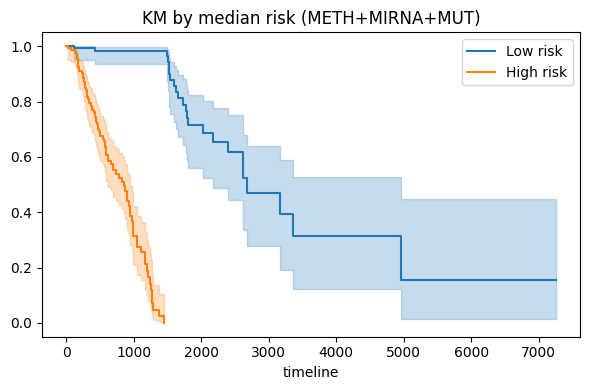

Log-rank p: 1.4210002060520832e-33


In [ ]:
# Cell 9: Kaplan-Meier for the best combo (median split)
best = res_df.iloc[0]
print("Best combo:", best['combo'], "mean cindex:", best['mean_cindex'])
best_combo = tuple(best['combo'].split("+"))
X_best = build_combo_matrix(best_combo, top_features_by_omics, omics_pp)
# Fit Cox on full data and compute risk score
patients = list(X_best.index)
clin_sub = clinical.loc[patients, ["overall_survival", "status"]].dropna()
X_best = X_best.loc[clin_sub.index]
df_full = X_best.copy()
df_full["time"] = clin_sub["overall_survival"]
df_full["event"] = clin_sub["status"]
cph = CoxPHFitter(penalizer=0.1)
cph.fit(df_full, duration_col="time", event_col="event", show_progress=False)
risk = cph.predict_partial_hazard(df_full.drop(columns=["time","event"]))
median_r = risk.median()
high_idx = risk[risk>=median_r].index
low_idx = risk[risk<median_r].index

from lifelines import KaplanMeierFitter
from lifelines.statistics import logrank_test
kmf = KaplanMeierFitter()
plt.figure(figsize=(6,4))
kmf.fit(df_full.loc[low_idx,"time"], df_full.loc[low_idx,"event"], label="Low risk")
ax = kmf.plot_survival_function()
kmf.fit(df_full.loc[high_idx,"time"], df_full.loc[high_idx,"event"], label="High risk")
kmf.plot_survival_function(ax=ax)
plt.title(f"KM by median risk ({best['combo']})")
plt.tight_layout()
plt.savefig(os.path.join(OUT_DIR, "best_combo_km.png"), dpi=200)
plt.show()

# log-rank p-value
res_lr = logrank_test(df_full.loc[low_idx,"time"], df_full.loc[high_idx,"time"], event_observed_A=df_full.loc[low_idx,"event"], event_observed_B=df_full.loc[high_idx,"event"])
print("Log-rank p:", res_lr.p_value)

Best single: MUT 0.7278489114996747


/tmp/ipython-input-323008431.py:51: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  ax = sns.barplot(data=df, x='mean_cindex', y='combo', order=order, palette="viridis", ci=None)
/tmp/ipython-input-323008431.py:51: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=df, x='mean_cindex', y='combo', order=order, palette="viridis", ci=None)


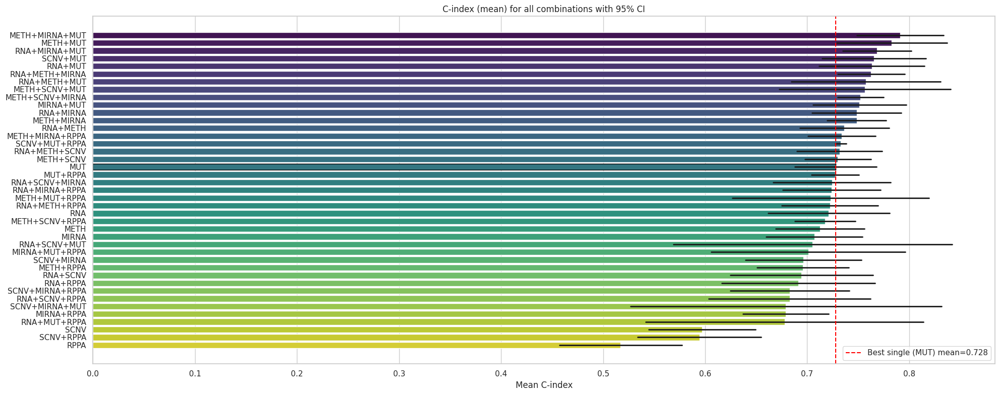

/tmp/ipython-input-323008431.py:74: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=multi_df, x='improvement_over_best_single', y='combo', order=multi_df['combo'], palette="coolwarm")


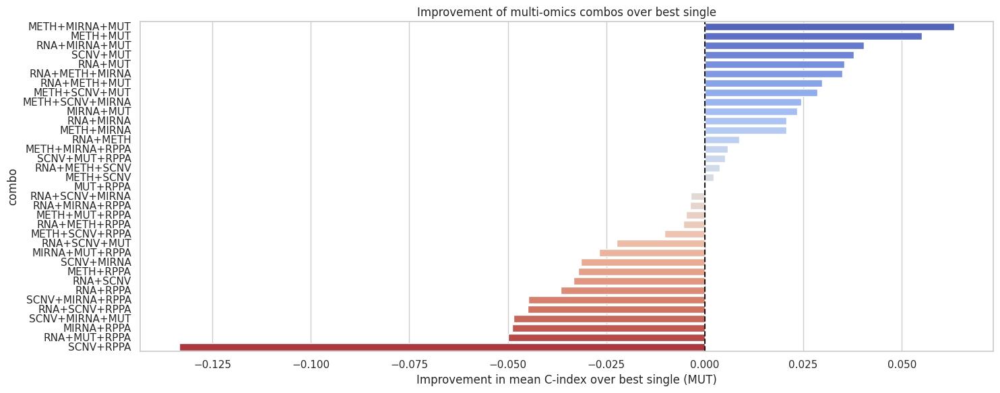

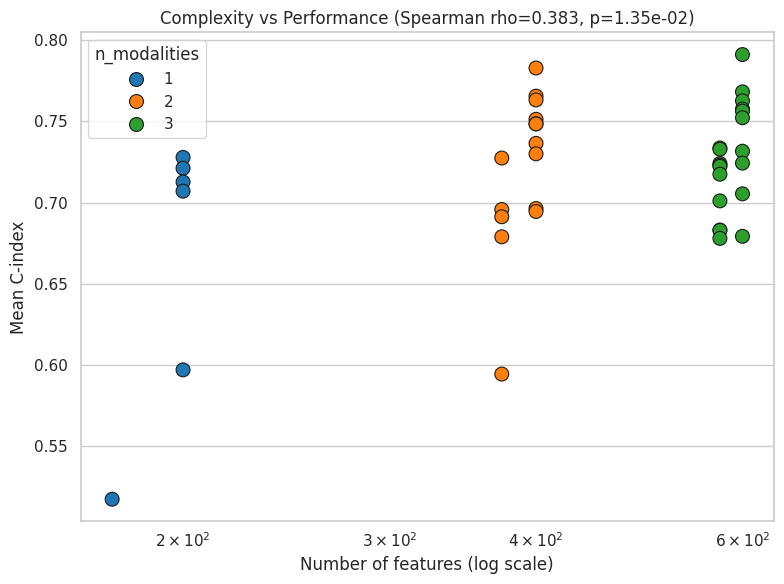

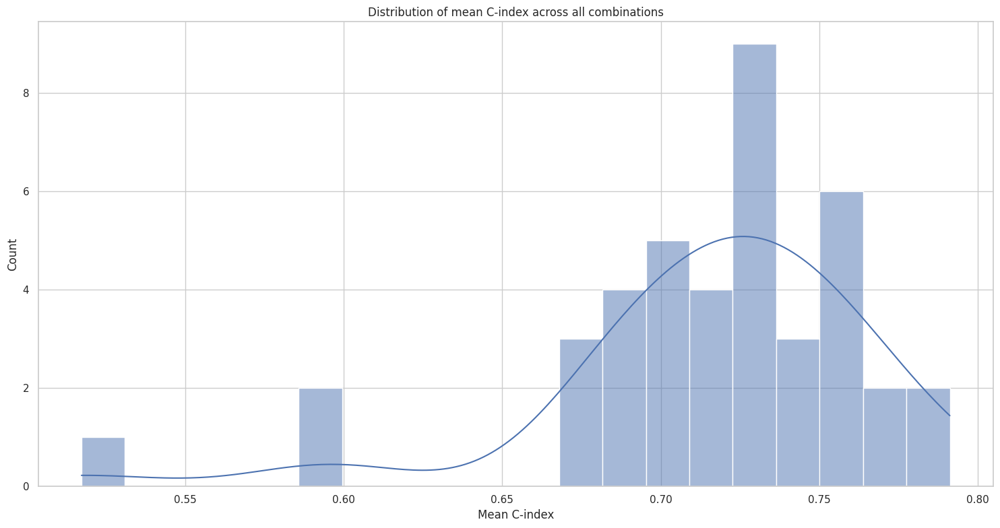

CI non-overlap count (True = likely non-overlapping): 3


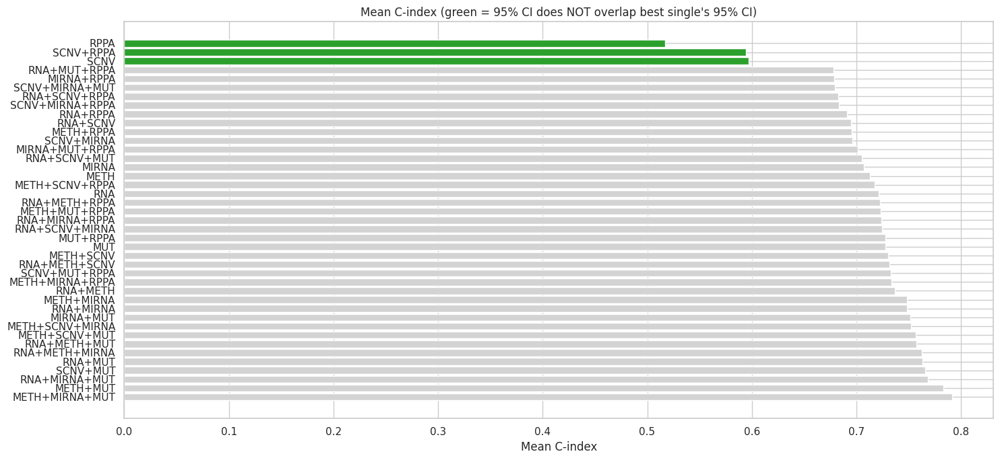

All figures and tables saved to: /content/drive/MyDrive/linkedOmics/analysis_figs


In [ ]:
# combo_results_analysis.py  — run in Colab
import os, ast, json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

# ---------- CONFIG ----------
CSV_PATH = "/content/drive/MyDrive/linkedOmics/analysis_results/combo_results.csv"   # <- update path
OUT_DIR = "/content/drive/MyDrive/linkedOmics/analysis_figs"
os.makedirs(OUT_DIR, exist_ok=True)
sns.set(style="whitegrid")

# ---------- LOAD ----------
df = pd.read_csv(CSV_PATH)
# Ensure numeric columns
for col in ['mean_cindex','std_cindex','ci95_lo','ci95_hi','n_features']:
    if col in df.columns:
        df[col] = pd.to_numeric(df[col], errors='coerce')

# Add modality count if not present
if 'n_modalities' not in df.columns:
    df['n_modalities'] = df['combo'].apply(lambda x: x.count('+')+1)

# Sort
df = df.sort_values('mean_cindex', ascending=False).reset_index(drop=True)

# ---------- Baseline (best single) ----------
singles = df[df['n_modalities'] == 1]
if singles.empty:
    raise ValueError("No single-omics rows found (n_modalities==1). Check CSV.")
best_single_row = singles.loc[singles['mean_cindex'].idxmax()]
best_single_name = best_single_row['combo']
best_single_mean = best_single_row['mean_cindex']
best_single_lo = best_single_row.get('ci95_lo', np.nan)
best_single_hi = best_single_row.get('ci95_hi', np.nan)
print("Best single:", best_single_name, best_single_mean)

# ---------- Compute improvement and relative improvement ----------
df['improvement_over_best_single'] = df['mean_cindex'] - best_single_mean
df['relative_improvement_pct'] = 100.0 * df['improvement_over_best_single'] / best_single_mean

# Save summary table for manuscript (top combos)
summary_cols = ['combo','n_modalities','n_features','mean_cindex','std_cindex','ci95_lo','ci95_hi','improvement_over_best_single','relative_improvement_pct']
df[summary_cols].to_csv(os.path.join(OUT_DIR, "combo_summary_stats.csv"), index=False)

# ---------- 1) C-index barplot with 95% CI ----------
plt.figure(figsize=(20, max(8, 0.18*len(df))))
order = df['combo']
ax = sns.barplot(data=df, x='mean_cindex', y='combo', order=order, palette="viridis", ci=None)
# add 95% CI lines
for i, row in df.iterrows():
    lo = row['ci95_lo']
    hi = row['ci95_hi']
    if not (np.isnan(lo) or np.isnan(hi)):
        ax.plot([lo, hi], [i, i], color='k', lw=2)
# highlight best single
if best_single_name in df['combo'].values:
    idx = df.index[df['combo']==best_single_name][0]
    ax.get_children()[idx].set_edgecolor('black')
plt.axvline(best_single_mean, color='red', linestyle='--', label=f"Best single ({best_single_name}) mean={best_single_mean:.3f}")
plt.xlabel("Mean C-index")
plt.ylabel("")
plt.title("C-index (mean) for all combinations with 95% CI")
plt.legend()
plt.tight_layout()
plt.savefig(os.path.join(OUT_DIR, "cindex_bar_with_CI.png"), dpi=400)
plt.show()

# ---------- 2) Improvement over best single (multi-modal only) ----------
multi_df = df[df['n_modalities'] > 1].copy().sort_values('improvement_over_best_single', ascending=False)
plt.figure(figsize=(15, max(6, 0.14*len(multi_df))))
sns.barplot(data=multi_df, x='improvement_over_best_single', y='combo', order=multi_df['combo'], palette="coolwarm")
plt.axvline(0, color='k', linestyle='--')
plt.xlabel(f"Improvement in mean C-index over best single ({best_single_name})")
plt.title("Improvement of multi-omics combos over best single")
plt.tight_layout()
plt.savefig(os.path.join(OUT_DIR, "improvement_over_best_single.png"), dpi=400)
plt.show()

# ---------- 3) Complexity vs Performance ----------
plt.figure(figsize=(8,6))
sns.scatterplot(data=df, x='n_features', y='mean_cindex', hue='n_modalities', palette='tab10', s=100, edgecolor='k')
plt.xscale('log')  # helpful if n_features varies widely
rho, pval = stats.spearmanr(df['n_features'].fillna(0), df['mean_cindex'].fillna(0))
plt.xlabel("Number of features (log scale)")
plt.ylabel("Mean C-index")
plt.title(f"Complexity vs Performance (Spearman rho={rho:.3f}, p={pval:.2e})")
plt.tight_layout()
plt.savefig(os.path.join(OUT_DIR, "complexity_vs_performance.png"), dpi=250)
plt.show()

# ---------- 4) C-index distribution (histogram/density) ----------
plt.figure(figsize=(15,8))
sns.histplot(df['mean_cindex'], kde=True, bins=20)
plt.xlabel("Mean C-index")
plt.title("Distribution of mean C-index across all combinations")
plt.tight_layout()
plt.savefig(os.path.join(OUT_DIR, "cindex_distribution.png"), dpi=400)
plt.show()

# ---------- 5) CI-overlap summary (vs best single) ----------
# CI non-overlap if combo.ci95_lo > best_single_hi or combo.ci95_hi < best_single_lo
def ci_non_overlap(row, base_lo, base_hi):
    lo = row['ci95_lo']
    hi = row['ci95_hi']
    if np.isnan(lo) or np.isnan(hi) or np.isnan(base_lo) or np.isnan(base_hi):
        return np.nan
    return (lo > base_hi) or (hi < base_lo)

df['ci_non_overlap_vs_best_single'] = df.apply(lambda r: ci_non_overlap(r, best_single_lo, best_single_hi), axis=1)

ci_table = df[['combo','n_features','mean_cindex','ci95_lo','ci95_hi','ci_non_overlap_vs_best_single']].copy()
ci_table.to_csv(os.path.join(OUT_DIR, "ci_overlap_summary.csv"), index=False)
print("CI non-overlap count (True = likely non-overlapping):", ci_table['ci_non_overlap_vs_best_single'].sum(skipna=True))

# Create a small barplot marking combos with non-overlap
plt.figure(figsize=(15, max(7, 0.12*len(df))))
col = df['ci_non_overlap_vs_best_single'].map({True:'tab:green', False:'lightgrey', np.nan:'lightgrey'})
plt.barh(df['combo'], df['mean_cindex'], color=col)
plt.xlabel("Mean C-index")
plt.title("Mean C-index (green = 95% CI does NOT overlap best single's 95% CI)")
plt.tight_layout()
plt.savefig(os.path.join(OUT_DIR, "cindex_bar_nonoverlap_marked.png"), dpi=400)
plt.show()

print("All figures and tables saved to:", OUT_DIR)
